In [3]:
import pandas as p
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
import random
import matplotlib.colors as mcolors


In [101]:
df=p.read_csv('covid.csv')
df
df.drop(['Lat'],axis=1,inplace=True)
df.drop(['Long'],axis=1,inplace=True)
df.drop(['Province/State'],axis=1,inplace=True)
df

,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20
0,Thailand,2,3,5,7,8,8,14,14,14,...,75,82,114,147,177,212,272,322,411,599
1,Japan,2,1,2,2,4,4,7,7,11,...,701,773,839,825,878,889,924,963,1007,1086
2,Singapore,0,1,3,3,4,5,7,7,10,...,200,212,226,243,266,313,345,385,432,455
3,Nepal,0,0,0,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,2
4,Malaysia,0,0,0,3,4,4,4,7,8,...,197,238,428,566,673,790,900,1030,1183,1306
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
482,Dominica,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
483,Grenada,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
484,Mozambique,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
485,Syria,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


# Getting the required data by excluding those days on which cases were higher than 70%

In [102]:
count=0
for col in df.columns:
    for i in df[col]:
        if(i == 0):
            count+=1
    if(count>341):
        df.drop([col],axis=1,inplace=True)
    count=0
        

In [103]:
df

,Country/Region,03-04-2020,03-05-2020,03-06-2020,03-07-2020,03-08-2020,03-09-2020,03-10-2020,03-11-2020,03-12-2020,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20
0,Thailand,43,47,48,50,50,50,53,59,70,75,82,114,147,177,212,272,322,411,599
1,Japan,331,360,420,461,502,511,581,639,639,701,773,839,825,878,889,924,963,1007,1086
2,Singapore,110,117,130,138,150,150,160,178,178,200,212,226,243,266,313,345,385,432,455
3,Nepal,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2
4,Malaysia,50,50,83,93,99,117,129,149,149,197,238,428,566,673,790,900,1030,1183,1306
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
482,Dominica,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
483,Grenada,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
484,Mozambique,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
485,Syria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


# We check once for the occurences of countries.

In [7]:
for col in df['Country/Region']:
    if(col=='China'):
        print(col)

China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China
China


# Grouping them and adding the cases respectively.

In [104]:
df=df.groupby("Country/Region").sum()

# Checking for Nan - values

In [105]:
df.isnull().any()

03-04-2020    False
03-05-2020    False
03-06-2020    False
03-07-2020    False
03-08-2020    False
03-09-2020    False
03-10-2020    False
03-11-2020    False
03-12-2020    False
3/13/20       False
3/14/20       False
3/15/20       False
3/16/20       False
3/17/20       False
3/18/20       False
3/19/20       False
3/20/20       False
3/21/20       False
3/22/20       False
dtype: bool

# Good to go

In [106]:
df

,03-04-2020,03-05-2020,03-06-2020,03-07-2020,03-08-2020,03-09-2020,03-10-2020,03-11-2020,03-12-2020,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20
Country/Region,,,,,,,,,,,,,,,,,,,
Afghanistan,1,1,1,1,4,4,5,7,7,7,11,16,21,22,22,22,24,24,40
Albania,0,0,0,0,0,2,10,12,23,33,38,42,51,55,59,64,70,76,89
Algeria,12,12,17,17,19,20,20,20,24,26,37,48,54,60,74,87,90,139,201
Andorra,1,1,1,1,1,1,1,1,1,1,1,1,2,39,39,53,75,88,113
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0,0,0,0,0,0,0,0,0,0,0,1,6,10,15,23,33,43,43
Venezuela,0,0,0,0,0,0,0,0,0,0,2,10,17,33,36,42,42,70,70
Vietnam,16,16,16,18,30,30,31,38,39,47,53,56,61,66,75,85,91,94,113


# For plotting the graph country wise.

In [11]:
colors = random.choices(list(mcolors.CSS4_COLORS.values()),k = 171)#For getting nice contrast of colors and no repeated colors :)


In [12]:
plt.figure(figsize=(250,200))
plt.pie(df['3/22/20'],colors=colors)
plt.title('Comparison',size=200)
plt.legend(df.index,loc="center left",prop={'size':100})
plt.show()

# For plotting the graph date wise.

In [13]:
date_wise_sum=[]
count=0
for col in df.columns:
    for i in df[col]:
       count+=i
    date_wise_sum.append(count)
    count=0

In [14]:
date_wise_sum

[95120,
 97882,
 101784,
 105821,
 109795,
 113561,
 118592,
 125865,
 128343,
 145193,
 156094,
 167446,
 181527,
 197142,
 214910,
 242708,
 272166,
 304524,
 335955]

In [15]:
date_wise=[col for col in df.columns]


In [16]:
colors_2 = random.choices(list(mcolors.CSS4_COLORS.values()),k = 19) #Different Colors!

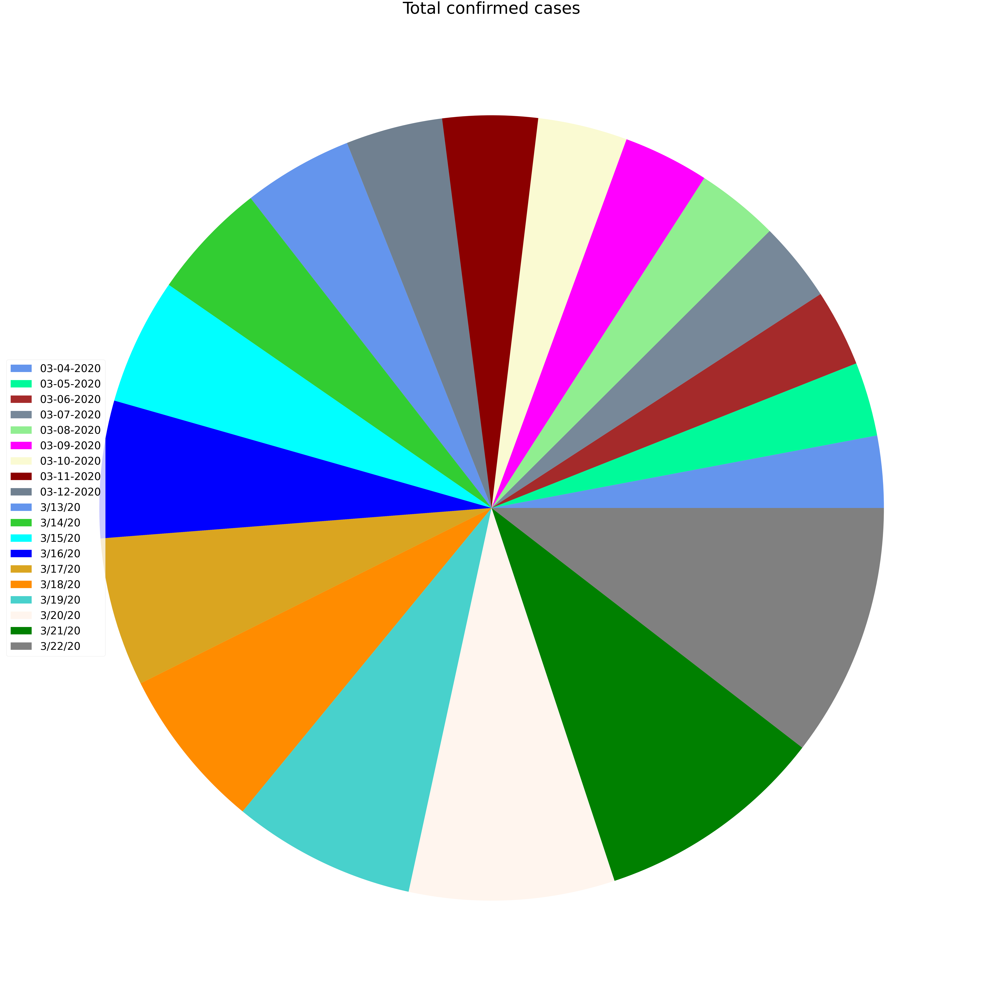

In [15]:
plt.figure(figsize=(220,110))
plt.pie(date_wise_sum,colors=colors_2)
plt.title('Total confirmed cases',size=100)
plt.legend(date_wise,loc="center left",prop={'size':64})

 
plt.show()

# For Plotting Continent wise.

In [29]:
conti_df4=p.DataFrame(p.read_csv("Continents-ll.csv")) #Csv file addition

In [30]:
conti_df4

,Continent,Country
0,Asia,Afghanistan
1,Europe,Albania
2,Africa,Algeria
3,Europe,Andorra
4,Africa,Angola
...,...,...
198,South America,Venezuela
199,Asia,Vietnam
200,Asia,Yemen
201,Africa,Zambia


In [33]:
c4=p.DataFrame(conti_df4.groupby('Country').sum()) # Country wise grouping

In [34]:
c4

,Continent
Country,
Afghanistan,Asia
Albania,Europe
Algeria,Africa
Andorra,Europe
Angola,Africa
...,...
Venezuela,South America
Vietnam,Asia
Yemen,Asia


In [35]:
df.index

Index(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria',
       ...
       'Uganda', 'Ukraine', 'United Arab Emirates', 'United Kingdom',
       'Uruguay', 'Uzbekistan', 'Venezuela', 'Vietnam', 'Zambia', 'Zimbabwe'],
      dtype='object', name='Country/Region', length=171)

In [36]:
c4.index

Index(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria',
       ...
       'UnitedKingdom', 'Uruguay', 'Uzbekistan', 'Vanuatu', 'VaticanCity',
       'Venezuela', 'Vietnam', 'Yemen', 'Zambia', 'Zimbabwe'],
      dtype='object', name='Country', length=202)

In [37]:
from fuzzywuzzy import fuzz    # String matching to get the accurate continents from second csv

In [65]:
i1=[]
c4_l= [i for i in c4.index]
df_l= [i for i in df.index]


In [66]:
for i in c4_l:
    for j in df_l:
        if(fuzz.ratio(i.lower(),j.lower())>=74):
            i1.append(i)

In [67]:
i1=dict.fromkeys(i1)

In [68]:
len(i1)

171

In [69]:
df_l

['Afghanistan',
 'Albania',
 'Algeria',
 'Andorra',
 'Angola',
 'Antigua and Barbuda',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas, The',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Benin',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Brazil',
 'Brunei',
 'Bulgaria',
 'Burkina Faso',
 'Cabo Verde',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cape Verde',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Congo (Brazzaville)',
 'Congo (Kinshasa)',
 'Costa Rica',
 "Cote d'Ivoire",
 'Croatia',
 'Cruise Ship',
 'Cuba',
 'Cyprus',
 'Czechia',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'East Timor',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Eswatini',
 'Ethiopia',
 'Fiji',
 'Finland',
 'France',
 'Gabon',
 'Gambia, The',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Grenada',
 'Guatemala',
 'Guinea',
 'Guyana',
 'Haiti',
 'Holy See',
 'Honduras',
 'Hu

In [57]:
i1.keys()

dict_keys(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina', 'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'CapeVerde', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cruise Ship', 'Cuba', 'Cyprus', 'Czechia', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'East Timor', 'Ecuador', 'Egypt', 'ElSalvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guyana', 'Haiti', 'Holy See', 'Honduras', 'Hungary', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Ital

In [70]:
c4

,Continent
Country,
Afghanistan,Asia
Albania,Europe
Algeria,Africa
Andorra,Europe
Angola,Africa
...,...
Venezuela,South America
Vietnam,Asia
Yemen,Asia


c4_l


In [71]:
continents={}
conti_name=[c for c in c4['Continent']]

In [72]:
continents={c4_l[i]:conti_name[i] for i in range(len(c4_l))}

In [73]:
continents                             

{'Afghanistan': 'Asia',
 'Albania': 'Europe',
 'Algeria': 'Africa',
 'Andorra': 'Europe',
 'Angola': 'Africa',
 'Antigua and Barbuda': 'North America',
 'Argentina': 'South America',
 'Armenia': 'Europe',
 'Australia': 'Oceania',
 'Austria': 'Europe',
 'Azerbaijan': 'Europe',
 'Bahamas': 'North America',
 'Bahrain': 'Asia',
 'Bangladesh': 'Asia',
 'Barbados': 'North America',
 'Belarus': 'Europe',
 'Belgium': 'Europe',
 'Belize': 'North America',
 'Benin': 'Africa',
 'Bhutan': 'Asia',
 'Bolivia': 'South America',
 'Bosnia and Herzegovina': 'Europe',
 'Botswana': 'Africa',
 'Brazil': 'South America',
 'Brunei': 'Asia',
 'Bulgaria': 'Europe',
 'Burkina': 'Africa',
 'Burma(Myanmar)': 'Asia',
 'Burundi': 'Africa',
 'Cambodia': 'Asia',
 'Cameroon': 'Africa',
 'Canada': 'North America',
 'CapeVerde': 'Africa',
 'Central African Republic': 'Africa',
 'Chad': 'Africa',
 'Chile': 'South America',
 'China': 'Asia',
 'Colombia': 'South America',
 'Comoros': 'Africa',
 'Congo (Brazzaville)': 'Afri

In [87]:
main={}

for i in i1.keys():
    for j,k in continents.items():
        if (i==j):
            l=main[i]=[]
            l.append(k)
            main[i]=str(k)

In [89]:
main


{'Afghanistan': 'Asia',
 'Albania': 'Europe',
 'Algeria': 'Africa',
 'Andorra': 'Europe',
 'Angola': 'Africa',
 'Antigua and Barbuda': 'North America',
 'Argentina': 'South America',
 'Armenia': 'Europe',
 'Australia': 'Oceania',
 'Austria': 'Europe',
 'Azerbaijan': 'Europe',
 'Bahamas': 'North America',
 'Bahrain': 'Asia',
 'Bangladesh': 'Asia',
 'Barbados': 'North America',
 'Belarus': 'Europe',
 'Belgium': 'Europe',
 'Benin': 'Africa',
 'Bhutan': 'Asia',
 'Bolivia': 'South America',
 'Bosnia and Herzegovina': 'Europe',
 'Brazil': 'South America',
 'Brunei': 'Asia',
 'Bulgaria': 'Europe',
 'Burkina': 'Africa',
 'Burundi': 'Africa',
 'Cambodia': 'Asia',
 'Cameroon': 'Africa',
 'Canada': 'North America',
 'CapeVerde': 'Africa',
 'Central African Republic': 'Africa',
 'Chad': 'Africa',
 'Chile': 'South America',
 'China': 'Asia',
 'Colombia': 'South America',
 'Congo (Brazzaville)': 'Africa',
 'Congo (Kinshasa)': 'Africa',
 'Costa Rica': 'North America',
 "Cote d'Ivoire": 'Africa',
 'Cr

In [107]:
df.insert(0,'Continents',main.values())

In [108]:
df

,Continents,03-04-2020,03-05-2020,03-06-2020,03-07-2020,03-08-2020,03-09-2020,03-10-2020,03-11-2020,03-12-2020,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20
Country/Region,,,,,,,,,,,,,,,,,,,,
Afghanistan,Asia,1,1,1,1,4,4,5,7,7,7,11,16,21,22,22,22,24,24,40
Albania,Europe,0,0,0,0,0,2,10,12,23,33,38,42,51,55,59,64,70,76,89
Algeria,Africa,12,12,17,17,19,20,20,20,24,26,37,48,54,60,74,87,90,139,201
Andorra,Europe,1,1,1,1,1,1,1,1,1,1,1,1,2,39,39,53,75,88,113
Angola,Africa,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,Asia,0,0,0,0,0,0,0,0,0,0,0,1,6,10,15,23,33,43,43
Venezuela,South America,0,0,0,0,0,0,0,0,0,0,2,10,17,33,36,42,42,70,70
Vietnam,Asia,16,16,16,18,30,30,31,38,39,47,53,56,61,66,75,85,91,94,113


In [ ]:
#REINDEXING

In [109]:
df.reset_index(level=0, inplace=True)

In [110]:
df

,Country/Region,Continents,03-04-2020,03-05-2020,03-06-2020,03-07-2020,03-08-2020,03-09-2020,03-10-2020,03-11-2020,...,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20
0,Afghanistan,Asia,1,1,1,1,4,4,5,7,...,7,11,16,21,22,22,22,24,24,40
1,Albania,Europe,0,0,0,0,0,2,10,12,...,33,38,42,51,55,59,64,70,76,89
2,Algeria,Africa,12,12,17,17,19,20,20,20,...,26,37,48,54,60,74,87,90,139,201
3,Andorra,Europe,1,1,1,1,1,1,1,1,...,1,1,1,2,39,39,53,75,88,113
4,Angola,Africa,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,Uzbekistan,Asia,0,0,0,0,0,0,0,0,...,0,0,1,6,10,15,23,33,43,43
167,Venezuela,South America,0,0,0,0,0,0,0,0,...,0,2,10,17,33,36,42,42,70,70
168,Vietnam,Asia,16,16,16,18,30,30,31,38,...,47,53,56,61,66,75,85,91,94,113
169,Zambia,Africa,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,2,2,2,3


In [111]:
df=df.groupby('Continents').sum()

In [112]:
df

,03-04-2020,03-05-2020,03-06-2020,03-07-2020,03-08-2020,03-09-2020,03-10-2020,03-11-2020,03-12-2020,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20
Continents,,,,,,,,,,,,,,,,,,,
Africa,78,87,115,117,167,175,203,241,267,337,427,524,634,768,928,1188,1436,1751,2260
Asia,84126,84970,86549,87893,88901,89657,90861,92264,93454,95470,97413,99323,101133,103414,105727,108451,111246,114435,117830
Europe,10657,12485,14701,17235,19977,22865,26233,31635,32467,46393,54506,62855,73389,84269,97628,115687,135642,156534,174438
North America,188,260,320,467,601,683,1061,1421,1829,2430,3017,3863,5192,7102,8672,14790,20494,27379,35539
Oceania,52,55,60,63,78,93,111,136,136,212,268,326,408,491,609,743,872,1172,1434
South America,19,25,39,46,71,88,123,168,190,351,463,555,771,1098,1346,1849,2476,3253,4454


# Sum Checking

In [113]:
2260+117830+174438+35539+1434+4454


335955

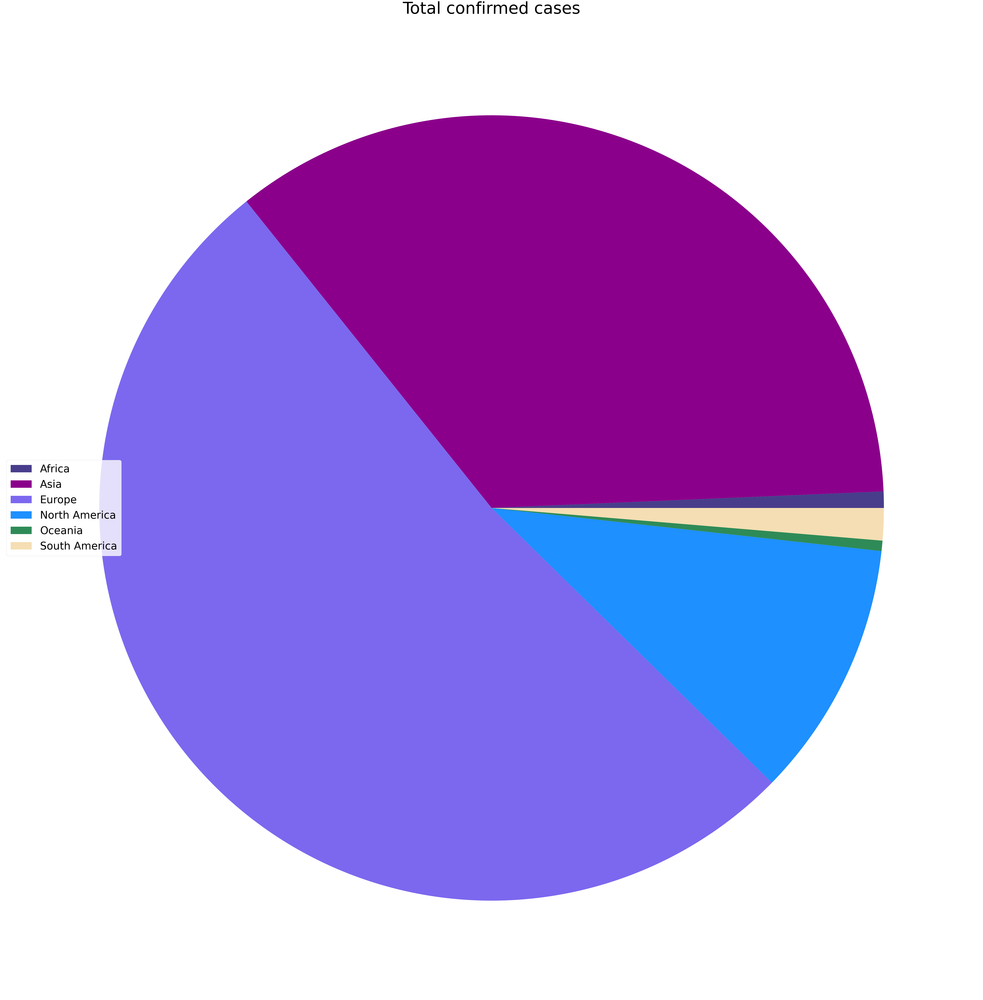

In [115]:
plt.figure(figsize=(220,110))
plt.pie(df['3/22/20'],colors=colors_2)
plt.title('Total confirmed cases',size=100)
plt.legend(df.index,loc="center left",prop={'size':64})

 
plt.show()